# Enunciado

Bienvenidos a la Actividad 1, donde pondremos en práctica todo lo aprendido durante el bloque 2. Esta actividad la realizaremos en clase, se terminará en casa (debería completarse en clase) y se entregará el día *8 de octubre*.

## ¿En qué consiste?

Vamos a poner en práctica cuatro aspectos del procesamiento de imágenes:
- Lectura de imagen y conversión a escala de grises
- _Umbralización_ de una imagen siguiendo los métodos vistos en clase (y comparándolos)
- _Morfología matemática_ con los operadores conocidos
- _Detección y medida de objetos_ dentro de la imagen. Este último aspecto lo veremos más adelante en el curso, con lo cual, lo que haremos aquí será sencillo y guiado (pero requerirá un esfuerzo pequeño para enfrentaros a un problema que no habéis visto antes)

La finalidad es sencilla. Se os dará una imagen, a color, que tiene varias tonalidades y que está pintada con círculos.

**La actividad consiste en contar el número de círculos de la imagen.**
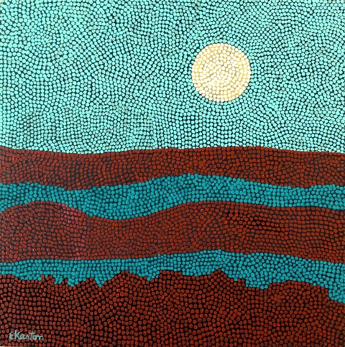

## Evaluación

Se evaluará de la siguiente manera:
- 0 puntos si no se presenta o si sólo se presenta el enunciado con modificaciones mínimas o si el ejercicio no resuelve el problema.
- 5 puntos si se presenta únicamente la resolución del ejercicio (en este caso un proceso que calcule el número de puntos), pero no se justifica los pasos realizados o no se comentan los resultados (comparación entre umbralizaciones, por ejemplo).
- 5-10 puntos, dependiendo de los comentarios realizados y de la profundidad de las explicaciones.

## Formato de entrega
- Se pide entregar el ejercicio de dos maneras:
-- En formato .py (con el código puro)
-- En formato .html

No se aceptará el formato .ipynb
Habilitaré una actividad en Canvas para que podáis subir ambos archivos.

# Inicialización

En primer lugar, cargamos todos los paquetes/frameworks que nos van a hacer falta. Se recomienda visitar la web: https://scikit-image.org/ para ver todas las funcionalidades que permite Scikit Image.

In [ ]:
# Paquetes necesarios para la realización de esta práctica (no son necesarios conocerlos ni entenderlos por ahora)
from skimage.io import imread
from skimage import transform as tf

import matplotlib.pyplot as plt

# Cargamos la función para convertir de RGB a Escala de grises
from skimage.color import rgb2gray

In [ ]:
# Paquete y funciones para realizar una umbralización con Scikit-image
from skimage.filters import threshold_otsu, threshold_local, threshold_niblack, threshold_sauvola


# Paquetes necesarios para la morfología matemática
from skimage.morphology import erosion, dilation, opening, closing
# Elementos estructurales
from skimage.morphology import disk, diamond, ball, rectangle

# Estas dos funciones nos sirven para detectar los objetos dentro de una imagen binaria
from skimage.morphology import label
from skimage.measure import regionprops

In [ ]:
# Defino una función para mostrar una imagen por pantalla con el criterio que considero más acertado
def imshow(img, title):
    fig, ax = plt.subplots(figsize=(7, 7))
    # El comando que realmente muestra la imagen
    ax.imshow(img,cmap=plt.cm.gray)
    # Para evitar que aparezcan los números en los ejes
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title(title)
    plt.show()

## Cargar la imagen

Lo primero de todo, vamos a leer la imagen. Recuerda que hay que subir la imagen cada vez que _inicies sesión_ en el notebook y que la ruta se mira haciendo botón derecho sobre el archivo.

Con lo cual, aquí vamos a hacer dos cosas:
- Cargar la imagen
- Convertirla a escala de grises

Hacemos esto para luego posteriormente umbralizar la imagen en escala de grises.

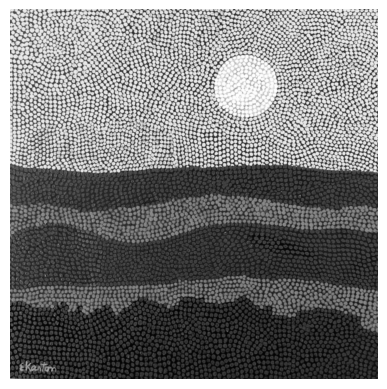

In [ ]:
# Cargar la imagen desde Google Drive (reemplaza la ruta)
imagen = imread('/content/Pintura_Puntos.jpg')

# Convertir la imagen a escala de grises
imagen_gris = rgb2gray(imagen)

# Mostrar la imagen en escala de grises
plt.imshow(imagen_gris, cmap='gray')
plt.axis('off')
plt.show()

 Ponemos la ruta del propio programa, no la del ordenador porlo que hemos tenido que subir la foto.  Al poner plt.axis("off") al poner off, tenemos otra manera de ocultar los ejes. En plt.imshow() incluimos cmap para que plt.show nos muestre la imagen en grises y no en color.


## Umbralizar la imagen con varios métodos

Vamos a probar ahora diferentes métodos para umbralizar la imagen. Se pide en esta actividad:
- Ejecutar cada método (para ello tendréis que ver en la documentación cómo invocarlo y qué parámetros necesita)
- Mostrar por pantalla el resultado de cada imagen, añadiendo una explicación de a qué corresponde cada imagen
- Hacer una comparación general de todos (es decir, cuál da mejores resultados, aspectos que observeis, etc...)
- Explicar a qué tipo corresponden los métodos de threshold_niblack y threshold_sauvola
- Por último, ¿se obtiene el mismo resultado si se rota la imagen 180º?¿Por qué?

Tenemos tres tipos de umbralización: global (Umbral único para toda la imagen), adaptativa (Umbral único para diferentes partes de
la imagen) y de Otsu (Separa elementos del fondo, maximiza
varianza entre clases de píxeles,
minimiza distancia intra clases). # Paquete y funciones para realizar una umbralización con Scikit-image
from skimage.filters import threshold_otsu, threshold_local, threshold_niblack, threshold_sauvola


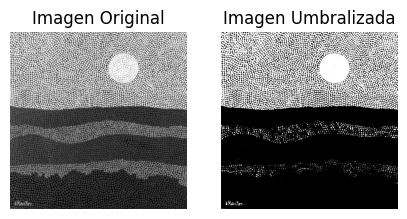

In [ ]:
#Empezamos por la umbralizacion global con el método de Otsu
# Ya hemos cargado la imagen y la tenemos en escala de grises
# Calcular el umbral global utilizando el método de Otsu
umbral = threshold_otsu(imagen_gris)

# Aplicar la umbralización global
imagen_umbralizada = imagen_gris > umbral

# Mostrar la imagen original y la imagen umbralizada
plt.figure(figsize=(5, 6))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(imagen_gris, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

# Imagen umbralizada
plt.subplot(1, 2, 2)
plt.imshow(imagen_umbralizada, cmap='gray')
plt.title('Imagen Umbralizada')
plt.axis('off')

plt.show()


Otsu determina un valor de umbral que mejor separa los objetos de la imagen del fondo, basándose en la distribución de intensidades de píxeles en la imagen. Este método es útil para segmentar automáticamente objetos en imágenes cuando el umbral adecuado no es conocido de antemano y puede ayudar en la extracción de características y análisis de imágenes.
Utilizando plt.figure(figsize=(5, 6)) podemos elegir el tamaño de las iamgenes de resultado. Inicialmente estaba en 12,6 pero era demasiado grande asi que lo he reducido. Por otro lado, con subplot mostramos ambas imágenes para poder ver la diferencia

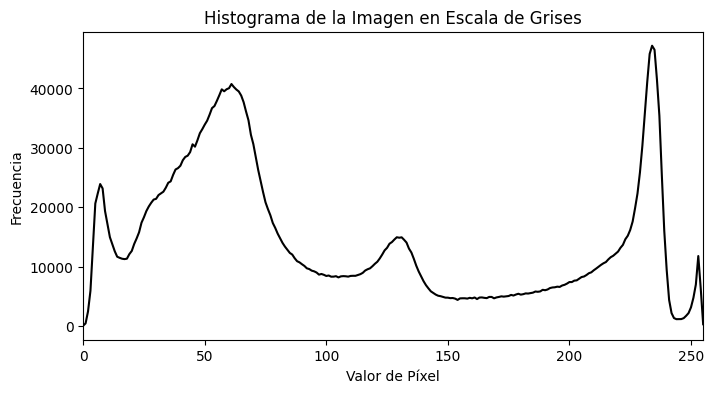

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# Supongamos que tienes una imagen en escala de grises almacenada en la variable "imagen_gris"
# Calcular el histograma
histograma = np.histogram(imagen_gris, bins=256, range=(0, 1))[0]

# Mostrar el histograma
plt.figure(figsize=(8, 4))
plt.title('Histograma de la Imagen en Escala de Grises')
plt.xlabel('Valor de Píxel')
plt.ylabel('Frecuencia')
plt.plot(histograma, color='black')
plt.xlim([0, 255])
plt.show()

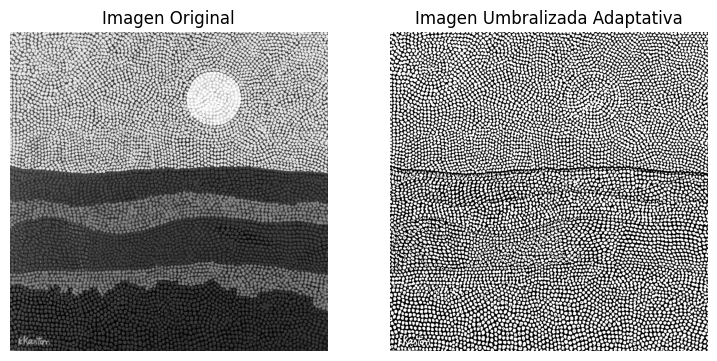

In [ ]:

# Calcular umbrales locales utilizando threshold_local
block_size = 49  # Tamaño del bloque de vecindad para el cálculo del umbral (ajusta según tu imagen)
umbral_local = threshold_local(imagen_gris, block_size)  # Puedes ajustar el valor de offset según sea necesario

# Aplicar la umbralización adaptativa
imagen_umbralizada_local = imagen_gris > umbral_local

# Mostrar la imagen original y la imagen umbralizada adaptativamente
plt.figure(figsize=(9, 6))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(imagen_gris, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

# Imagen umbralizada adaptativamente
plt.subplot(1, 2, 2)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa')
plt.axis('off')

plt.show()

Como de grande es la imagen pequeña que considero como local, cuanto mayor es el block size, más imagen considero para determinar el umbral. Por tanto, cuanto menor sea el tamaño, mejor. Además, deberá ser impar
ya ayuda a evitar problemas de simetría y centrado alrededor de cada píxel. La umbralización local es útil especialmente cuando se trabaja con imágenes que tienen cambios en la iluminación, detalles finos o variaciones locales en la intensidad de los píxeles.

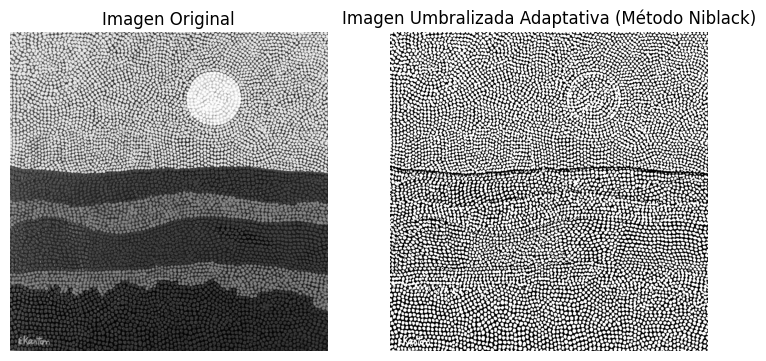

In [ ]:
# Calcular umbral local utilizando threshold_niblack
block_size = 41  # Tamaño del bloque de vecindad para el cálculo del umbral (ajusta según tu imagen)
umbral_local = threshold_niblack(imagen_gris, window_size=block_size)  # Puedes ajustar el valor de k según sea necesario

# Aplicar la umbralización adaptativa
imagen_umbralizada_niblack = imagen_gris > umbral_local

# Mostrar la imagen original y la imagen umbralizada adaptativamente
plt.figure(figsize=(9, 6))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(imagen_gris, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

# Imagen umbralizada adaptativamente
plt.subplot(1, 2, 2)
plt.imshow(imagen_umbralizada_niblack, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa (Método Niblack)')
plt.axis('off')

plt.show()

Este método se utiliza para segmentar regiones de una imagen con iluminación variable o cuando se necesita una umbralización que se adapte a cambios locales en la intensidad. He establecidocomo tamaño de bloque 47 ya que con números menores, había demasiadas manchas blancas y noumbralizaba bien del todo

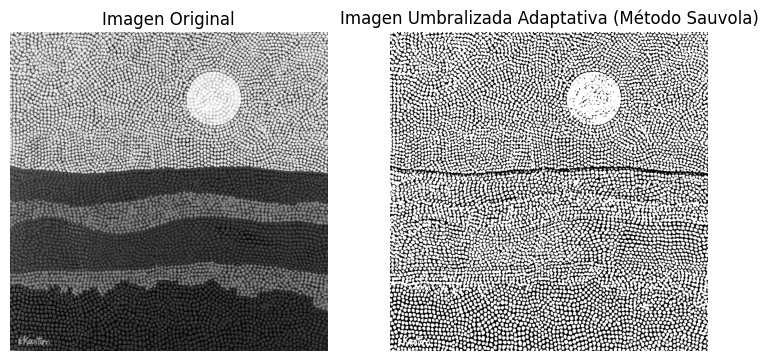

In [ ]:
# Calcular el umbral local utilizando threshold_sauvola
window_size = 47  # Tamaño de la ventana para el cálculo del umbral (ajusta según tu imagen)
umbral_local = threshold_sauvola(imagen_gris, window_size=window_size)

# Aplicar la umbralización adaptativa
imagen_umbralizada_sauvola = imagen_gris > umbral_local

# Mostrar la imagen original y la imagen umbralizada adaptativamente
plt.figure(figsize=(9, 6))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(imagen_gris, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

# Imagen umbralizada adaptativamente
plt.subplot(1, 2, 2)
plt.imshow(imagen_umbralizada_sauvola, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa (Método Sauvola)')
plt.axis('off')

plt.show()

Se trata de una técnica valiosa para segmentar imágenes en presencia de variaciones locales en la intensidad de los píxeles. Reducción de Efectos de Iluminación Irregula: útil cuando se trabaja con imágenes que tienen problemas de iluminación desigual, como documentos escaneados o imágenes médicas, donde las áreas pueden estar sobreexpuestas o subexpuestas.

Hacer una comparación general de todos (es decir, cuál da mejores resultados, aspectos que observeis, etc...)
En primer lugar, la mejor umbralización en este caso, es la umbralización adaptativa local, es la que nos permite diferenciar el mayor número de puntos en la imagen. En segundo lugar, estaría Niblack,
 ya queel resultado es prácticamente el mismo. Los otros métodos devuelven una imagen en la que el sol es practicamente un punto grande.

El método Niblack y Sauvola forman parte de la umbralizacion adaptativa en la que utiliza umbral para distintas partes locales de la imagen

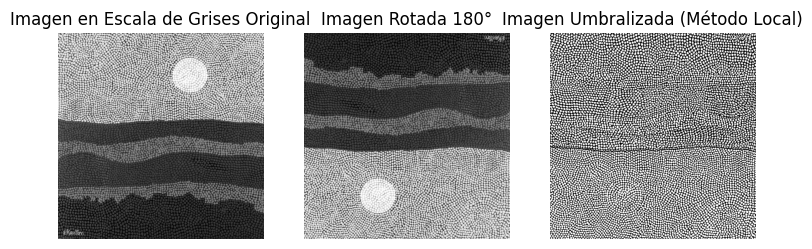

In [ ]:
from skimage import io, transform, color, filters
import matplotlib.pyplot as plt
# Rotar la imagen 180 grados
imagen_rotada = transform.rotate(imagen_gris, 180)

# Calcular umbral local utilizando threshold_local (ajusta el tamaño del bloque según sea necesario)
block_size = 41
umbral_local = filters.threshold_local(imagen_rotada, block_size, offset=0)  # Offset establecido en 0

# Aplicar la umbralización adaptativa a la imagen rotada
imagen_umbralizada = imagen_rotada > umbral_local

# Mostrar la imagen en escala de grises original, la imagen rotada y la imagen umbralizada
plt.figure(figsize=(9, 6))

# Imagen en escala de grises original
plt.subplot(1, 3, 1)
plt.imshow(imagen_gris, cmap='gray')
plt.title('Imagen en Escala de Grises Original')
plt.axis('off')

# Imagen rotada
plt.subplot(1, 3, 2)
plt.imshow(imagen_rotada, cmap='gray')
plt.title('Imagen Rotada 180°')
plt.axis('off')

# Imagen umbralizada
plt.subplot(1, 3, 3)
plt.imshow(imagen_umbralizada, cmap='gray')
plt.title('Imagen Umbralizada (Método Local)')
plt.axis('off')

plt.show()

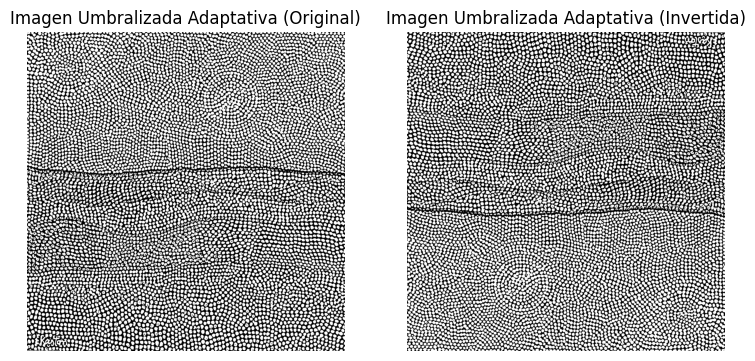

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

# Invertir verticalmente la imagen umbralizada local (imagen_umbralizada_local)
imagen_invertida = transform.rotate(imagen_umbralizada_local, 180)

# Mostrar la imagen umbralizada local original y la imagen umbralizada invertida
plt.figure(figsize=(9, 6))

# Imagen umbralizada local original
plt.subplot(1, 2, 1)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa (Original)')
plt.axis('off')

# Imagen umbralizada local invertida
plt.subplot(1, 2, 2)
plt.imshow(imagen_invertida, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa (Invertida)')
plt.axis('off')

plt.show()

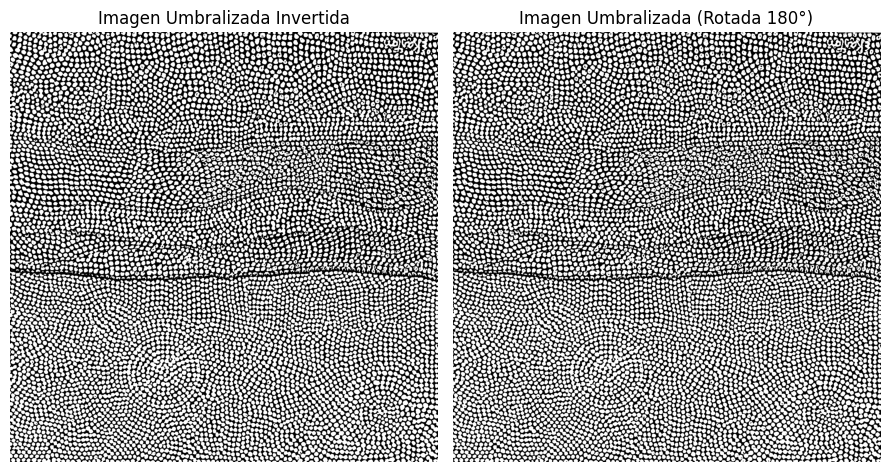

In [ ]:
import matplotlib.pyplot as plt

# Crear una figura con dos subplots
plt.figure(figsize=(9, 6))

# Subplot 1: Imagen umbralizada invertida
plt.subplot(1, 2, 1)
plt.imshow(imagen_invertida, cmap='gray')
plt.title('Imagen Umbralizada Invertida')
plt.axis('off')

# Subplot 2: Imagen umbralizada a partir de la imagen rotada 180
plt.subplot(1, 2, 2)
plt.imshow(imagen_umbralizada, cmap='gray')
plt.title('Imagen Umbralizada (Rotada 180°)')
plt.axis('off')

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar la figura con ambas imágenes
plt.show()

Tras rotar la imagen 180º y umbralizar, hemos obtenido la imagen umbralizada invertida. La he ploteado al lado de la imagen, una vez umbrlizada invertida  (imagen invertida). Podemos observar que ambas muestran el mismo resultado.

In [ ]:
# Os tendría que ir quedando una cosa así

In [ ]:
# Este es el mejor resultado que tendríais que alcanzar

# Morfología Matemática

Como se puede apreciar en la imagen hay varios elementos imperfectos:
- Hay círculos que están en contacto con otros círculos
- Hay círculos que están huecos por centro
- Hay círculos que no están cerrados del todo

Mediante el uso de morfología matemática (concretamente los cuatro operadores visto en clase) y los posibles elementos estructurales existentes, se pide:
- Decidir qué elemento estructural, y por qué, es el más adecuado. Indicar también el tamaño del elemento estructural que se ha decidido escoger.
- ¿Qué operador o secuencia de operadores elegiríais?
- Una vez elegido operador y elemento estructural, repetir este mismo proceso (es decir, elegir operador y elemento estructural), para la imagen _complementaria_, ¿qué conclusiones sacas de esto?


<ipython-input-20-da8e29999c35>:6: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  imagen_dilatada = morphology.dilation(imagen_umbralizada_local, selem=elemento_estructural)


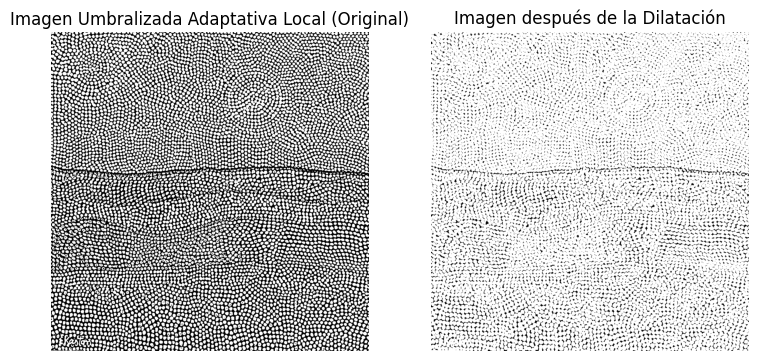

In [ ]:
from skimage import io, color, morphology
import matplotlib.pyplot as plt

# Realizar la dilatación
elemento_estructural = morphology.disk(3)  # Puedes ajustar el tamaño del elemento estructural según sea necesario
imagen_dilatada = morphology.dilation(imagen_umbralizada_local, selem=elemento_estructural)

# Mostrar la imagen original umbralizada y la imagen después de la dilatación
plt.figure(figsize=(9, 6))

# Imagen umbralizada adaptativa local original
plt.subplot(1, 2, 1)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa Local (Original)')
plt.axis('off')

# Imagen después de la dilatación
plt.subplot(1, 2, 2)
plt.imshow(imagen_dilatada, cmap='gray')
plt.title('Imagen después de la Dilatación')
plt.axis('off')

plt.show()

La dilatación puede ayudar a expandir los círculos y separarlos cuando están en contacto aunque debemos ajustar el tamaño del elemento estructural para controlar la separación deseada.

disk(3) crea un elemento estructural circular con un radio de 3 píxeles. Esto significa que la ventana utilizada para las operaciones de apertura o clausura tiene un diámetro de 7 píxeles (3 píxeles desde el centro a la circunferencia y otros 3 píxeles desde la circunferencia de nuevo al centro).

<ipython-input-19-354c38f92d34>:6: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  imagen_dilatada = morphology.dilation(imagen_umbralizada_local, selem=elemento_estructural)


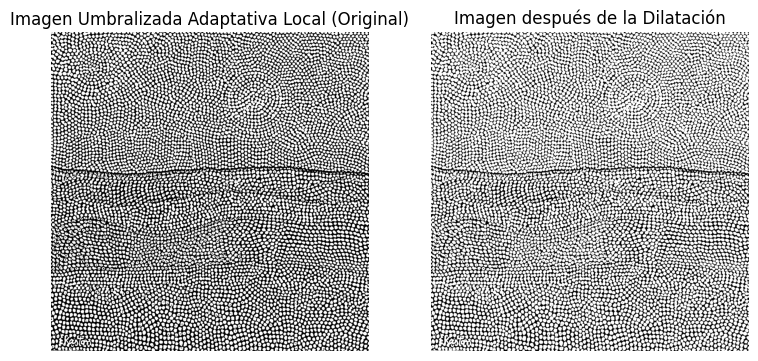

In [ ]:
from skimage import io, color, morphology
import matplotlib.pyplot as plt

# Realizar la dilatación
elemento_estructural = morphology.disk(1)  # Puedes ajustar el tamaño del elemento estructural según sea necesario
imagen_dilatada = morphology.dilation(imagen_umbralizada_local, selem=elemento_estructural)

# Mostrar la imagen original umbralizada y la imagen después de la dilatación
plt.figure(figsize=(9, 6))

# Imagen umbralizada adaptativa local original
plt.subplot(1, 2, 1)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa Local (Original)')
plt.axis('off')

# Imagen después de la dilatación
plt.subplot(1, 2, 2)
plt.imshow(imagen_dilatada, cmap='gray')
plt.title('Imagen después de la Dilatación')
plt.axis('off')

plt.show()

Al disminuir el tamaño de disk estamos consiguiendoun mejor resultado, distingue la imagen mejor, puedo preservar mejor los detalles finos.

<ipython-input-25-4d54e10f41c2>:6: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  imagen_dilatada = morphology.dilation(imagen_umbralizada_local, selem=elemento_estructural)


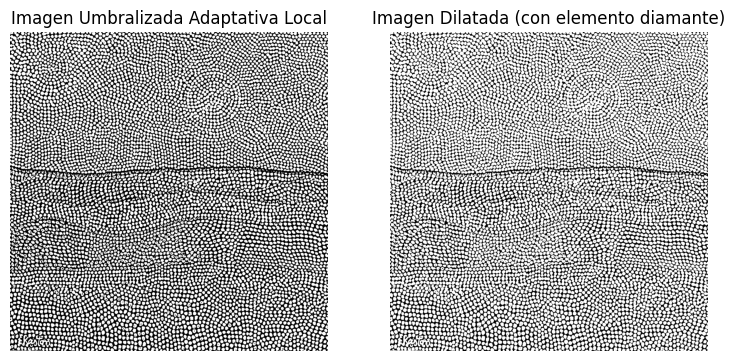

In [ ]:
from skimage import io, color, morphology
import matplotlib.pyplot as plt

# Realizar la dilatación con elemento estructural en forma de diamante
elemento_estructural = morphology.diamond(1)  # Puedes ajustar el tamaño del elemento estructural según sea necesario
imagen_dilatada = morphology.dilation(imagen_umbralizada_local, selem=elemento_estructural)

# Mostrar la imagen original umbralizada y la imagen después de la dilatación
plt.figure(figsize=(9, 6))

# Imagen umbralizada adaptativa local original
plt.subplot(1, 2, 1)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa Local')
plt.axis('off')

# Imagen después de la dilatación con elemento estructural en forma de diamante
plt.subplot(1, 2, 2)
plt.imshow(imagen_dilatada, cmap='gray')
plt.title('Imagen Dilatada (con elemento diamante)')
plt.axis('off')

plt.show()


He probado a cambiar el elemento estructural, en lugar de disk, he utilizado diamond. Sin embargo, he podido comprobar que disk en nuestro caso es la mejor opción ya que tiene forma circular o de disco, el elemento diamond, tiene forma de diamante, es más adecuado cuando tengamos formas angulares. Además he intentado poner ball, pero daba error ya que la imagen no era en 2D. Por todo esto, el elemento estructural elegido es disk de tamaño 1.

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:274: FutureWarning: `selem` is a deprecated argument name for `closing`. It will be removed in version 1.0. Please use `footprint` instead.
  warnings.warn(self.warning_msg.format(


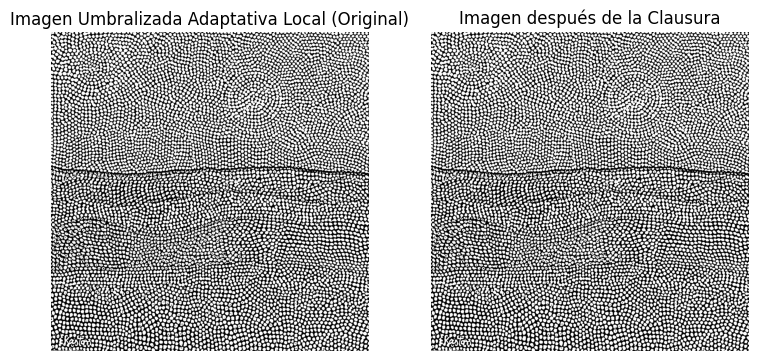

In [ ]:
# Realizar la clausura
elemento_estructural = morphology.disk(1)  # Puedes ajustar el tamaño del elemento estructural según sea necesario
imagen_cerrada = morphology.closing(imagen_umbralizada_local, selem=elemento_estructural)

# Mostrar la imagen original umbralizada y la imagen después de la clausura
plt.figure(figsize=(9, 6))

# Imagen umbralizada adaptativa local original
plt.subplot(1, 2, 1)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa Local (Original)')
plt.axis('off')

# Imagen después de la clausura
plt.subplot(1, 2, 2)
plt.imshow(imagen_cerrada, cmap='gray')
plt.title('Imagen después de la Clausura')
plt.axis('off')

plt.show()

Para rellenar los círculos que están huecos en el centro, el operador adecuado es la clausura. La clausura (dilatación seguida de erosión) puede ayudar a cerrar huecos en objetos. De nuevo, el tamaño del elemento estructural dependerá del tamaño de los huecos que deseas cerrar.


<ipython-input-28-55e859a7c021>:3: FutureWarning: `selem` is a deprecated argument name for `erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  imagen_erodada = morphology.erosion(imagen_umbralizada_local, selem=elemento_estructural)


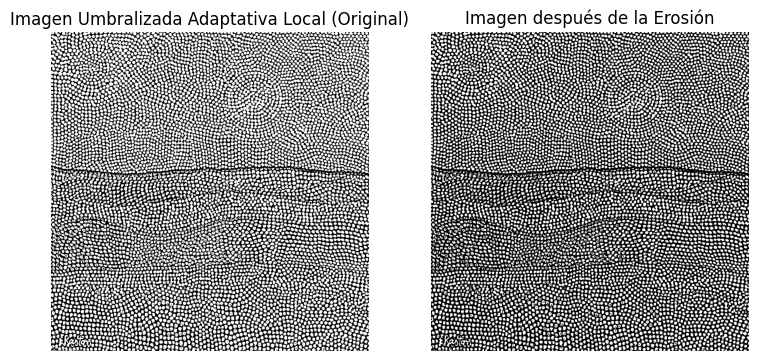

In [ ]:
# Realizar la erosión
elemento_estructural = morphology.disk(1)  # Puedes ajustar el tamaño del elemento estructural según sea necesario
imagen_erodada = morphology.erosion(imagen_umbralizada_local, selem=elemento_estructural)

# Mostrar la imagen original umbralizada y la imagen después de la erosión
plt.figure(figsize=(9, 6))

# Imagen umbralizada adaptativa local original
plt.subplot(1, 2, 1)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa Local (Original)')
plt.axis('off')

# Imagen después de la erosión
plt.subplot(1, 2, 2)
plt.imshow(imagen_erodada, cmap='gray')
plt.title('Imagen después de la Erosión')
plt.axis('off')

plt.show()


 En el contexto de círculos en una imagen, la erosión tenderá a hacer que los círculos sean más pequeños y posiblemente los fragmentará si están en contacto.


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:274: FutureWarning: `selem` is a deprecated argument name for `opening`. It will be removed in version 1.0. Please use `footprint` instead.
  warnings.warn(self.warning_msg.format(


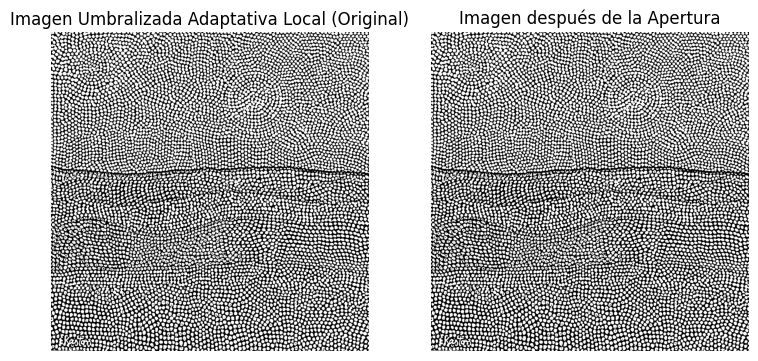

In [ ]:
# Realizar la apertura
elemento_estructural = morphology.disk(1)  # Puedes ajustar el tamaño del elemento estructural según sea necesario
imagen_abierta = morphology.opening(imagen_umbralizada_local, selem=elemento_estructural)

# Mostrar la imagen original umbralizada y la imagen después de la apertura
plt.figure(figsize=(9, 6))

# Imagen umbralizada adaptativa local original
plt.subplot(1, 2, 1)
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.title('Imagen Umbralizada Adaptativa Local (Original)')
plt.axis('off')

# Imagen después de la apertura
plt.subplot(1, 2, 2)
plt.imshow(imagen_abierta, cmap='gray')
plt.title('Imagen después de la Apertura')
plt.axis('off')

plt.show()

Tras la realizacion de los 4 óperadores, las mejores opciones serían apertura y erosón. La erosión reduce el tamaño de los objetos en una imagen y puede ayudar a separar puntos que están muy cerca uno del otro. Después de aplicar la erosión, puedes contar los puntos de manera más precisa. En segundo lugar, estaría la apertura, para luego contar puntos individuales, pero reducir la posibilidad de que puntos cercanos se unan. La erosión en la apertura eliminaría pequeñas regiones de la imagen, lo que podría ayudar a separar puntos cercanos antes de realizar la dilatación.

<ipython-input-46-6bf4b20f3fd2>:7: FutureWarning: `selem` is a deprecated argument name for `erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  imagen_erodada_complementaria_umbralizada = morphology.erosion(imagen_complementaria_umbralizada, selem=elemento_estructural)


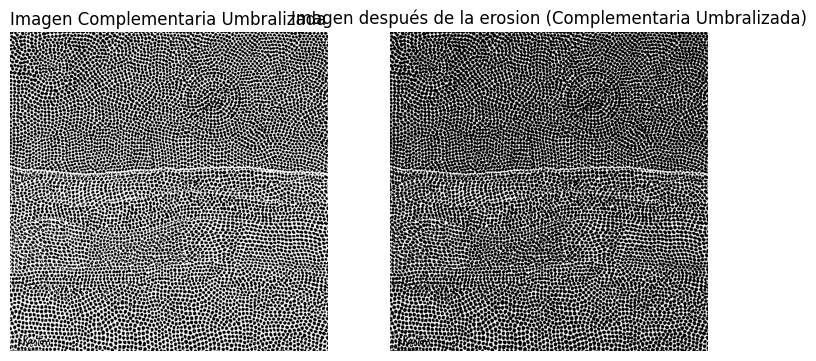

In [ ]:
#Imagen complementaria
# Crear la imagen complementaria restando 255 menos la umbralizada
imagen_complementaria_umbralizada = 255 - imagen_umbralizada_local

# Realizar la dilatación en la imagen complementaria umbralizada utilizando disk(1)
elemento_estructural = morphology.disk(1)
imagen_erodada_complementaria_umbralizada = morphology.erosion(imagen_complementaria_umbralizada, selem=elemento_estructural)

# Mostrar la imagen complementaria umbralizada original y la imagen después de la dilatación
plt.figure(figsize=(9, 6))

# Imagen complementaria umbralizada original
plt.subplot(1, 2, 1)
plt.imshow(imagen_complementaria_umbralizada, cmap='gray')
plt.title('Imagen Complementaria Umbralizada')
plt.axis('off')

# Imagen después de la dilatación en la imagen complementaria umbralizada
plt.subplot(1, 2, 2)
plt.imshow(imagen_erodada_complementaria_umbralizada, cmap='gray')
plt.title('Imagen después de la erosion (Complementaria Umbralizada)')
plt.axis('off')

plt.show()

Haciendo la imagen complementaria conseguimos que lo que antes eran 0 sean 1 y viceversa. Ahora los puntos negros tienen contornos blancos, lo cuál impide que se puedan contar bien los puntos yq que el contorno balnco engloba muchos puntos, y los contaría como uno solo.

# Contando círculos

Haciendo uso de las funcionalidades cargadas al principio, se pide hacer una función que:
- Reciba como parámetro una imagen binaria
- Compruebe que es binaria y si no es binaria, deberá imprimir por pantalla que no es binaria
- Cuente el número de círculos dentro de la imagen.
- Devuelva (return) dicho número de círculos.

Por último, ¿qué se podría hacer para asegurar que no se tienen en cuenta posibles errores en la umbralización como pequeños puntos o posible ruido que haya llegado hasta este punto?

La imagen es binaria.


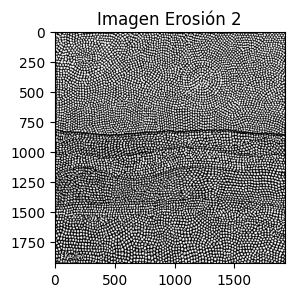

In [ ]:
# Crear una figura con un tamaño específico de 9:6
plt.figure(figsize=(3, 3))
# Trazar la imagen usando plt.imshow()
plt.imshow(imagen_erodada, cmap='gray')
plt.title('Imagen Erosión 2')

# Verificar si la imagen es binaria
es_binaria = (imagen_erodada.min() == 0) and (imagen_erodada.max() == 1)

# Imprimir el resultado
if es_binaria:
    print("La imagen es binaria.")
else:
    print("La imagen no es binaria.")

In [ ]:
# Función para contar el número de círculos
def count_circles(imagen_binaria):
  # Haz cosas
  num_circulos = 'pongo esto solo para que veais cómo sería la estructura'
  return num_circulos

In [ ]:
# Os tendría que ir quedando una cosa así
from PIL import Image

# Especifica la ruta de acceso de tu imagen
ruta_imagen = '/content/Pintura_Puntos.jpg'

# Cargar la imagen
imagen = Image.open(ruta_imagen)

# Convertir la imagen a escala de grises
imagen_gris = imagen.convert('L')

# Mostrar la imagen en escala de grises
imagen_gris.show()

# Guardar la imagen en escala de grises si es necesario
imagen_gris.save('imagen_gris.jpg')

In [ ]:
import cv2
import numpy as np

def count_circles(imagen_binaria_dilatada):
    # Encontrar contornos en la imagen
    contornos, _ = cv2.findContours(imagen_binaria_dilatada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Contar el número de contornos (círculos)
    num_circulos = len(contornos)

    return num_circulos


In [ ]:
# Supongamos que tienes la imagen de erosión llamada "imagen_erodada"
num_circulos_erodados = count_circles(imagen_erodada)

# Imprimir el número de círculos en la imagen de erodada
print("Número de círculos en la imagen de erodada:", num_circulos_erodados)

Número de círculos en la imagen de erodada: 6231


Nuestra imagen erodada tiene al rededor de 6231 pixeles. Además vamos a contar puntos de imagenes con el resto de operadores para comprobar cuál tiene el número mayor de puntos.

In [ ]:
# Supongamos que tienes la imagen binaria de apertura llamada "imagen_apertura"
num_circulos_apertura = count_circles(imagen_abierta)

# Imprimir el número de círculos en la imagen de apertura
print("Número de círculos en la imagen de apertura:", num_circulos_apertura)


Número de círculos en la imagen de apertura: 5849


In [ ]:
# Supongamos que tienes la imagen binaria dilatada llamada "imagen_dilatada"
num_circulos = count_circles(imagen_dilatada)

# Imprimir el número de círculos
print("Número de círculos en la imagen dilatada:", num_circulos)


Número de círculos en la imagen dilatada: 3880


In [ ]:
# Supongamos que tienes la imagen de clausura llamada "imagen_cerrada"
num_circulos_cerrados = count_circles(imagen_cerrada)

# Imprimir el número de círculos en la imagen de clausura
print("Número de círculos en la imagen de clausura:", num_circulos_cerrados)


Número de círculos en la imagen de clausura: 4935


Hemos podido comprobar que el mejor operador era la erosión ya que es la imagen que más puntos nos ha devuelto, ha sido capaz de separar puntos que estaban unidos.

Vamos a contar los puntos de la imagen complementaria, podremos comprobar que no cuenta casi puntos

In [ ]:
# Supongamos que tienes la imagen de erosion llamada "imagen_erodada_complementaria_umbralizada"
num_circulos_cerrados = count_circles(imagen_erodada_complementaria_umbralizada)

# Imprimir el número de círculos en la imagen de clausura
print("Número de círculos en la imagen complementaria erodada:", num_circulos_cerrados)


Número de círculos en la imagen complementaria erodada: 1


Esto se debe  a que hemos sustituido 0 por 1 y viceversa, no es capaz de contar cuando el contorno es blanco,por eso obtenemos este resultado.

# (Bonus) Automatizamos el proceso de extracción

Esta sección no es obligatoria pero la pongo para aquellos que quieran saber "¿y ahora qué se haría?".

Lo que hemos hecho hasta ahora es:
- Encontrar un método de umbralización adecuado (que tiene unos parámetros que ya hemos fijado - según nuestro criterio)
- Hemos utilizado unos métodos de morfología matemática, también con sus parámetros

Es decir, tenemos varios parámetros y tenemos una función que nos dice cuál es el número de puntos dada una imagen. Variando dichos parámetros, variará también el número de puntos, pero no parece haber una relación directa.

También no hay que olvidar que desconocemos el número de puntos (nunca se ha dicho, aunque siempre puedes contarlos), por lo que no podemos seguir un proceso de aprendizaje supervisado (tipo descenso del gradiente sobre los parámetros anteriores para encontrar el mejor resultado).

Pero lo que sí podemos hacer es iterar el valor de los parámetros para alcanzar un máximo de puntos (asumiendo que dicho máximo corresponderá con el mejor resultado). Esto suele hacerse cuando no sabemos exáctamente el resultado que esperamos.

En definitiva, ahora se buscaría realizar un proceso iterativo para encontrar el valor máximo del número de puntos. Para ello haría falta:
- Crear una función que englobe todos los procesos anteriores (umbralización, morfología matemática, etc...) y que tome como parámetro de entrada una imagen en color y devuelva el número de puntos.
- Crear los intervalos donde variarán todos los parámetros que queremos ir modificando
- Crear un proceso iterativo que vaya recorriendo todas las combinaciones de elementos (se recomienda el uso de `product` del paquete `itertools`).
- Una vez terminado el proceso quedarnos con la combinación de paráteros ganadora y el resultado del número de puntos.

Podría decirse que esa combinación de parámetros es la mejor.
